In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from cocoLoader import load_coco_dataset
from UNet import UNet
from PatchGAN import PatchGAN
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
#from pix2pix import pix2pix_training

DATAPATH = './models/'
# GPU training
DEVICE = (torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))
print(f"Training on device {DEVICE}.")
torch.cuda.memory_allocated()

/home/ubuntu/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Training on device cuda.


0

In [6]:
from cocoLoader import load_coco_dataset

BATCH_SIZE = 12
IMG_SIZE = 286
# Select image categories to train colorization for
train_dataloader, valid_dataloader = load_coco_dataset(batch_size=BATCH_SIZE,
                                                       size=10000,
                                                       dim=IMG_SIZE,
                                                       cats=('banana', 'apple'))

loading annotations into memory...
Done (t=14.64s)
creating index...
index created!
Dataset size: 504


In [3]:
def pix2pix_training(generator, discriminator, gen_optimizer, dis_optimizer, n_epochs, train_loader, valid_loader, lreg,
                    D_starts = True):
    
    # Define loss
    best_loss = float('Inf')
    GAN_loss = nn.BCELoss()
    L1_crit = nn.L1Loss() 
    
    # Optimizers
    optimizers = [dis_optimizer, gen_optimizer]
    
    for epoch in range(n_epochs):
        # Who starts training
        D_training = D_starts
        G_training = not D_starts
        
        train_loss = 0.0
        valid_loss = 0.0
        # Training
        for original, gray in train_loader:
            original = original.to(device=DEVICE)
            gray = gray.to(device=DEVICE)
            
            # Set training modes
            discriminator.train(D_training)
            for param in discriminator.parameters():
                 param.requires_grad = D_training
                    
            generator.train(G_training)
            for param in generator.parameters():
                 param.requires_grad = G_training
            
            # Generate image
            generated = generator(gray)
            d_generated = discriminator(generated, gray)
            
            # Train discriminator - loss
            if D_training:
                opt = 0
                d_original = discriminator(original, gray)
                loss_generated = GAN_loss(d_generated, torch.zeros(d_generated.size()).to(device=DEVICE))
                loss_original = GAN_loss(d_original, torch.ones(d_original.size()).to(device=DEVICE))
                loss = 0.5*(loss_generated + loss_original)
            
            # Train generator - loss
            elif G_training:
                opt = 1
                loss_generated = GAN_loss(d_generated, torch.zeros(d_generated.size()).to(device=DEVICE))
                reg = lreg*L1_crit(original, generated)
                loss = -1*loss_generated + reg
                
            else:
                raise Exception('You are not training anything')
                
            # Train
            optimizers[opt].zero_grad()
            loss.backward()
            optimizers[opt].step()
            
            # Change training for next batch
            D_training = not D_training
            G_training = not G_training
            
            # Save loss
            train_loss += loss.item()
        torch.cuda.empty_cache()
        
        # Validation
        with torch.no_grad():
            # Set training modes
            discriminator.eval()
            generator.eval()
            
            for original, gray in valid_loader:
                original = original.to(device=DEVICE)
                gray = gray.to(device=DEVICE)

                # Generate image
                generated = generator(gray)
                d_generated = discriminator(generated, gray)

                # loss
                d_original = discriminator(original, gray)
                loss_generated = GAN_loss(d_generated, torch.zeros(d_generated.size()).to(device=DEVICE))
                loss_original = GAN_loss(d_original, torch.ones(d_original.size()).to(device=DEVICE))
                loss = 0.5*(loss_generated + loss_original)
                valid_loss += loss.item()
                
            torch.cuda.empty_cache()

            train_loss = train_loss/len(train_loader)
            valid_loss = valid_loss/len(valid_loader)

            print('{} Epoch {}, Train {:.5f}, Valid {:.5f}'.format(dt.datetime.now(), epoch, train_loss, valid_loss))
            if train_loss < best_loss:
                best_loss = train_loss
                torch.save(generator.state_dict(), DATAPATH + 'G_{}reg.pt'.format(lreg))
                print(f'---- Saving {epoch}-th epoch for {train_loss = :2.5f}')
                # Plot
                plt.figure(figsize=(12, 60))
                mean = (0.485, 0.456, 0.406)
                std = (0.229, 0.224, 0.225)
                mean = [-1 * x / y for x, y in zip(mean, std)]
                std = [1 / x for x in std]
                unnormalize = torchvision.transforms.Normalize(mean=mean, std=std)
                for colored, grayscale in valid_dataloader:
                    c = colored[0]
                    g = grayscale[0]
                    plt.subplot(1, 3, 1)
                    plt.imshow(unnormalize(c).permute(1, 2, 0))
                    plt.subplot(1, 3, 2)
                    plt.imshow(g.permute(1, 2, 0), 'gray')
                    generated = generator(g.to(device=DEVICE).unsqueeze(0)).detach().squeeze(0)
                    generated = unnormalize(generated)
                    plt.subplot(1, 3, 3)
                    plt.imshow(generated.squeeze(0).cpu().permute(1, 2, 0))
                plt.show()
            
            torch.cuda.empty_cache()

2023-01-14 13:41:15.253092 Epoch 0, Train 48.37169, Valid 0.69819


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 0-th epoch for train_loss = 48.37169


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


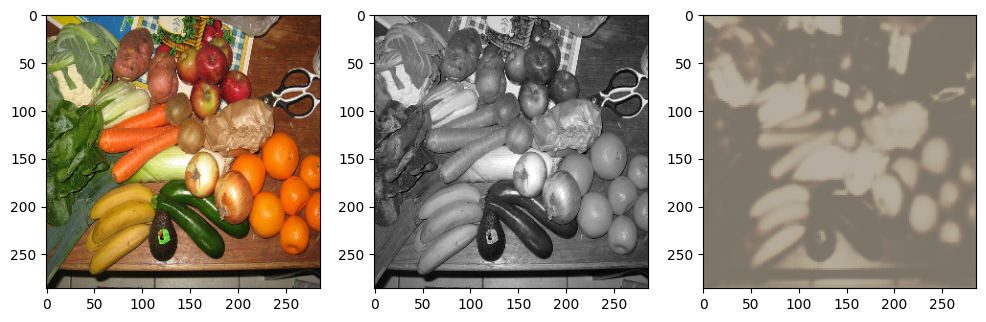

2023-01-14 13:41:30.862302 Epoch 1, Train 45.28176, Valid 0.89413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 1-th epoch for train_loss = 45.28176


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


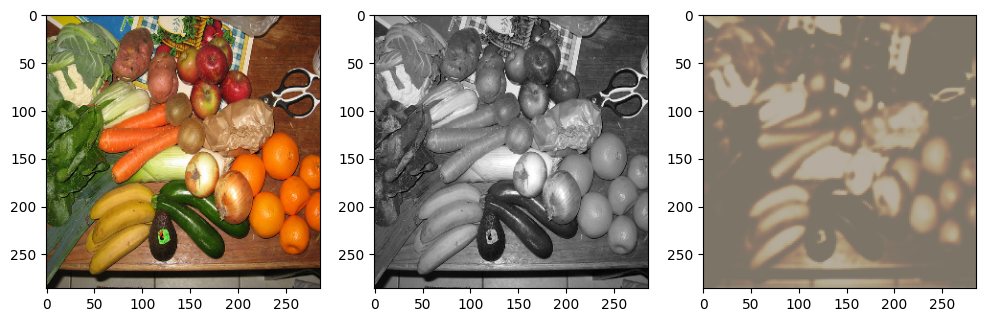

2023-01-14 13:41:46.118021 Epoch 2, Train 44.30899, Valid 0.93649


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 2-th epoch for train_loss = 44.30899


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


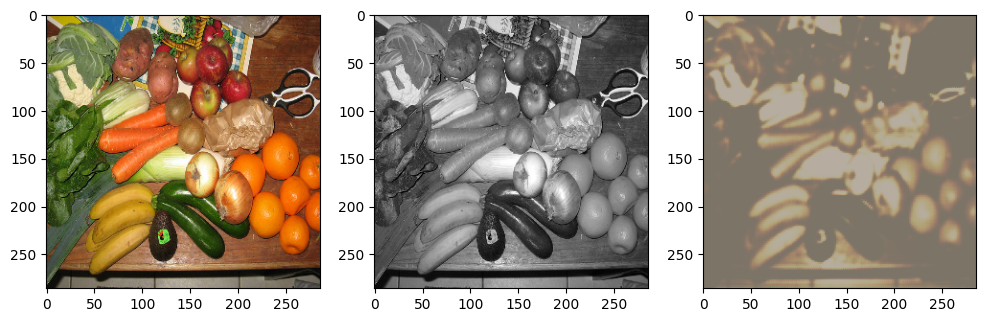

2023-01-14 13:42:01.320335 Epoch 3, Train 44.30240, Valid 1.04996


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 3-th epoch for train_loss = 44.30240


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


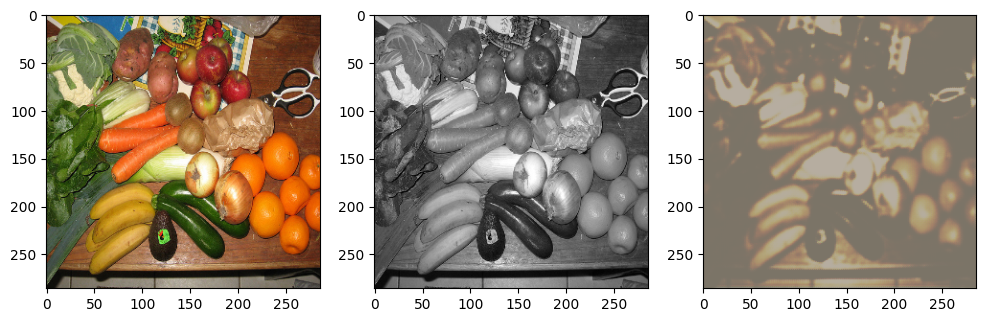

2023-01-14 13:42:17.134355 Epoch 4, Train 44.20872, Valid 0.56249


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 4-th epoch for train_loss = 44.20872


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


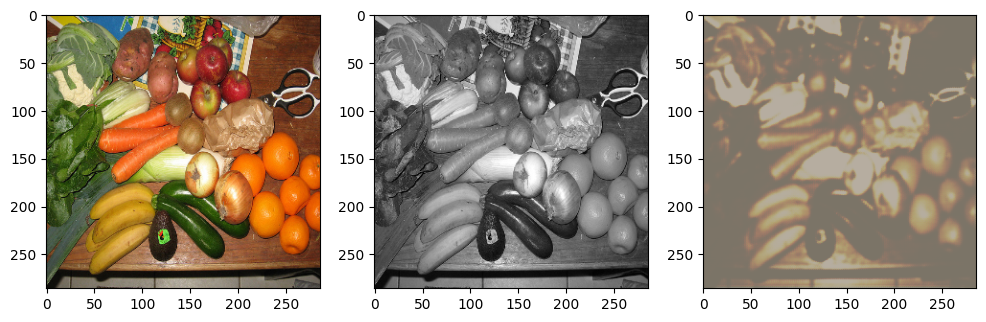

2023-01-14 13:42:32.372657 Epoch 5, Train 43.47702, Valid 0.65271


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 5-th epoch for train_loss = 43.47702


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


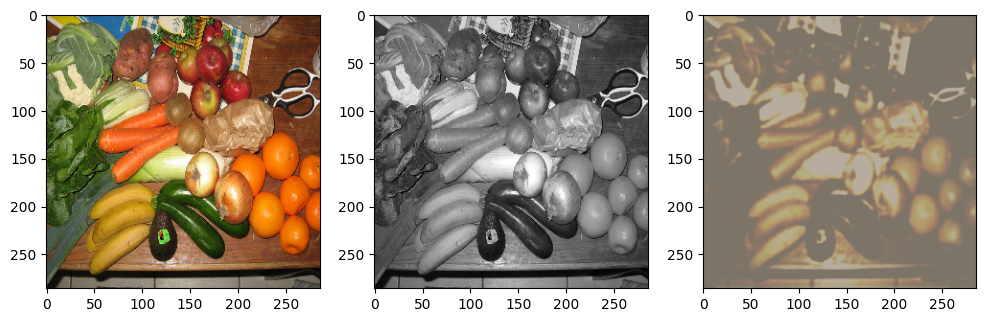

2023-01-14 13:42:47.790169 Epoch 6, Train 43.92740, Valid 0.99721
2023-01-14 13:43:01.305120 Epoch 7, Train 43.74361, Valid 0.67656
2023-01-14 13:43:14.587623 Epoch 8, Train 44.37218, Valid 1.93800
2023-01-14 13:43:28.137938 Epoch 9, Train 44.01263, Valid 0.31714
2023-01-14 13:43:41.748046 Epoch 10, Train 42.53069, Valid 0.96367


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 10-th epoch for train_loss = 42.53069


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


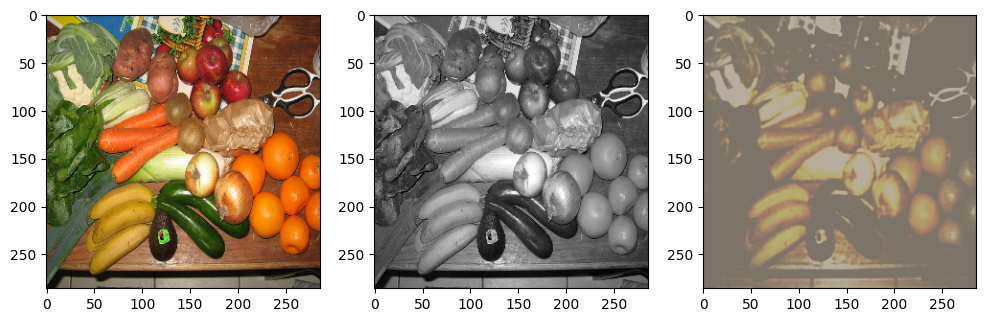

2023-01-14 13:43:57.462365 Epoch 11, Train 43.54273, Valid 0.50870
2023-01-14 13:44:11.078639 Epoch 12, Train 43.67407, Valid 0.60440
2023-01-14 13:44:24.581800 Epoch 13, Train 43.27230, Valid 0.58200
2023-01-14 13:44:38.101890 Epoch 14, Train 43.81826, Valid 0.58813
2023-01-14 13:44:51.230776 Epoch 15, Train 43.33178, Valid 0.58839
2023-01-14 13:45:04.286573 Epoch 16, Train 43.40055, Valid 0.54848
2023-01-14 13:45:17.325982 Epoch 17, Train 43.16097, Valid 0.62050
2023-01-14 13:45:30.382665 Epoch 18, Train 42.65350, Valid 0.64085
2023-01-14 13:45:43.548378 Epoch 19, Train 43.70680, Valid 0.53562
2023-01-14 13:45:56.826213 Epoch 20, Train 43.37848, Valid 0.67291
2023-01-14 13:46:10.100263 Epoch 21, Train 43.44858, Valid 0.76012
2023-01-14 13:46:23.366331 Epoch 22, Train 42.82341, Valid 0.59025
2023-01-14 13:46:36.663119 Epoch 23, Train 44.08132, Valid 0.77484
2023-01-14 13:46:50.129503 Epoch 24, Train 43.72530, Valid 0.61861
2023-01-14 13:47:03.315266 Epoch 25, Train 42.94367, Valid 0.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 29-th epoch for train_loss = 41.87550


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


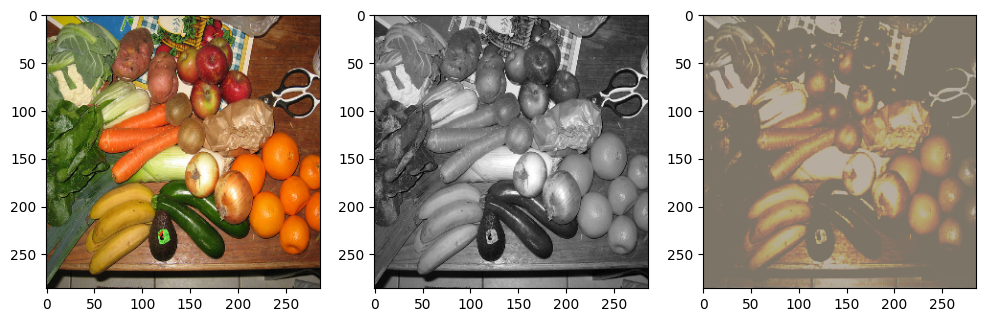

2023-01-14 13:48:11.751445 Epoch 30, Train 42.55365, Valid 0.76155
2023-01-14 13:48:24.777131 Epoch 31, Train 42.77883, Valid 0.73304
2023-01-14 13:48:37.856752 Epoch 32, Train 43.44551, Valid 0.68717
2023-01-14 13:48:51.020323 Epoch 33, Train 43.03983, Valid 0.65354
2023-01-14 13:49:04.307082 Epoch 34, Train 43.20464, Valid 0.57359
2023-01-14 13:49:17.580478 Epoch 35, Train 43.13052, Valid 0.85188
2023-01-14 13:49:30.923625 Epoch 36, Train 42.50693, Valid 0.76374
2023-01-14 13:49:44.290226 Epoch 37, Train 43.05399, Valid 0.76666
2023-01-14 13:49:57.720046 Epoch 38, Train 41.96994, Valid 0.78731
2023-01-14 13:50:11.030256 Epoch 39, Train 42.90611, Valid 0.81886
2023-01-14 13:50:24.373119 Epoch 40, Train 42.66975, Valid 0.77935
2023-01-14 13:50:37.546975 Epoch 41, Train 41.30123, Valid 0.62443


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 41-th epoch for train_loss = 41.30123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


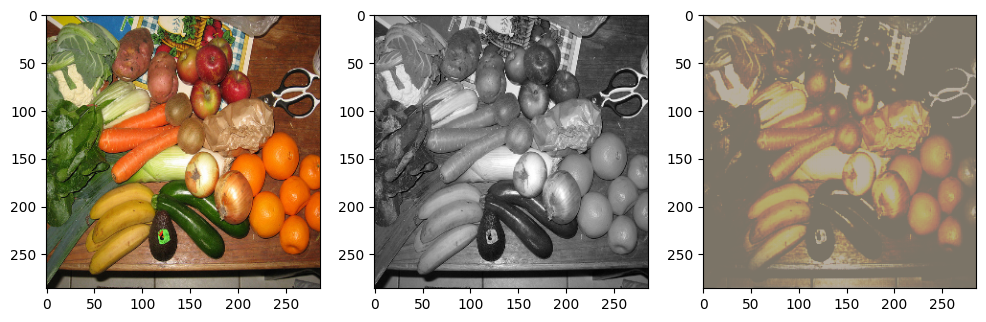

2023-01-14 13:50:52.914975 Epoch 42, Train 43.19110, Valid 0.80092
2023-01-14 13:51:05.979606 Epoch 43, Train 43.58079, Valid 0.74081
2023-01-14 13:51:19.120058 Epoch 44, Train 43.45755, Valid 0.90498
2023-01-14 13:51:32.486919 Epoch 45, Train 42.16945, Valid 0.79346
2023-01-14 13:51:45.760535 Epoch 46, Train 42.45304, Valid 0.88222
2023-01-14 13:51:59.049236 Epoch 47, Train 43.15508, Valid 0.98907
2023-01-14 13:52:12.374995 Epoch 48, Train 41.63480, Valid 0.74954
2023-01-14 13:52:25.708344 Epoch 49, Train 42.65500, Valid 0.83133
2023-01-14 13:52:38.885719 Epoch 50, Train 42.61582, Valid 0.75166
2023-01-14 13:52:52.204053 Epoch 51, Train 41.94602, Valid 0.91911
2023-01-14 13:53:05.216063 Epoch 52, Train 42.04392, Valid 0.98003
2023-01-14 13:53:18.448971 Epoch 53, Train 42.32525, Valid 0.87683
2023-01-14 13:53:31.830596 Epoch 54, Train 42.81646, Valid 0.81006
2023-01-14 13:53:45.111139 Epoch 55, Train 41.78647, Valid 0.95040
2023-01-14 13:53:58.229383 Epoch 56, Train 42.26345, Valid 0.9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 57-th epoch for train_loss = 40.30676


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


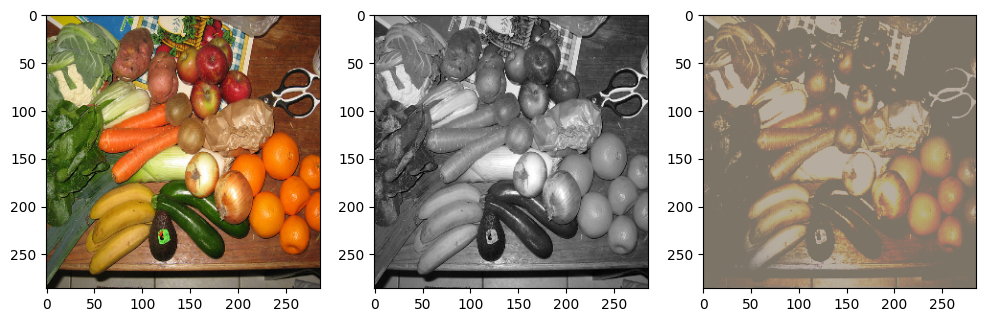

2023-01-14 13:54:26.908598 Epoch 58, Train 41.99445, Valid 1.58990
2023-01-14 13:54:39.989263 Epoch 59, Train 42.52594, Valid 0.46138
2023-01-14 13:54:53.096688 Epoch 60, Train 42.17835, Valid 0.59932
2023-01-14 13:55:06.107492 Epoch 61, Train 42.88513, Valid 0.56078
2023-01-14 13:55:19.082941 Epoch 62, Train 41.94048, Valid 0.66058
2023-01-14 13:55:32.496478 Epoch 63, Train 41.63677, Valid 0.46775
2023-01-14 13:55:45.766748 Epoch 64, Train 42.38864, Valid 0.53895
2023-01-14 13:55:59.503189 Epoch 65, Train 42.28180, Valid 0.44432
2023-01-14 13:56:13.036502 Epoch 66, Train 42.30704, Valid 0.51064
2023-01-14 13:56:26.471004 Epoch 67, Train 41.98603, Valid 0.50065
2023-01-14 13:56:39.696152 Epoch 68, Train 41.91996, Valid 0.51450
2023-01-14 13:56:52.845001 Epoch 69, Train 41.94930, Valid 0.50020
2023-01-14 13:57:05.963944 Epoch 70, Train 41.57017, Valid 0.57775
2023-01-14 13:57:18.947622 Epoch 71, Train 41.68583, Valid 0.53835
2023-01-14 13:57:31.958012 Epoch 72, Train 41.44469, Valid 0.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 105-th epoch for train_loss = 39.76140


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


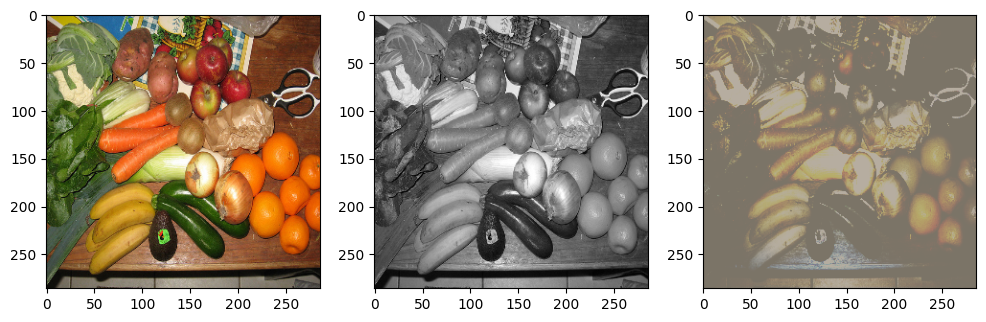

2023-01-14 14:05:10.567108 Epoch 106, Train 40.85788, Valid 0.45494
2023-01-14 14:05:23.569928 Epoch 107, Train 40.75173, Valid 0.58230
2023-01-14 14:05:36.666965 Epoch 108, Train 40.83907, Valid 0.49070
2023-01-14 14:05:49.927890 Epoch 109, Train 41.36897, Valid 0.51770
2023-01-14 14:06:03.040010 Epoch 110, Train 42.11741, Valid 0.46413
2023-01-14 14:06:16.141317 Epoch 111, Train 40.58207, Valid 0.45197
2023-01-14 14:06:29.118404 Epoch 112, Train 40.40486, Valid 0.42395
2023-01-14 14:06:42.115141 Epoch 113, Train 41.45415, Valid 0.43992
2023-01-14 14:06:55.502872 Epoch 114, Train 42.04389, Valid 0.47473
2023-01-14 14:07:08.988450 Epoch 115, Train 41.57465, Valid 0.52580
2023-01-14 14:07:22.511522 Epoch 116, Train 40.74993, Valid 0.53631
2023-01-14 14:07:35.732889 Epoch 117, Train 41.33951, Valid 0.49189
2023-01-14 14:07:48.973679 Epoch 118, Train 41.20524, Valid 0.47715
2023-01-14 14:08:02.113034 Epoch 119, Train 41.50812, Valid 0.47923
2023-01-14 14:08:15.089673 Epoch 120, Train 40.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 180-th epoch for train_loss = 39.61054


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


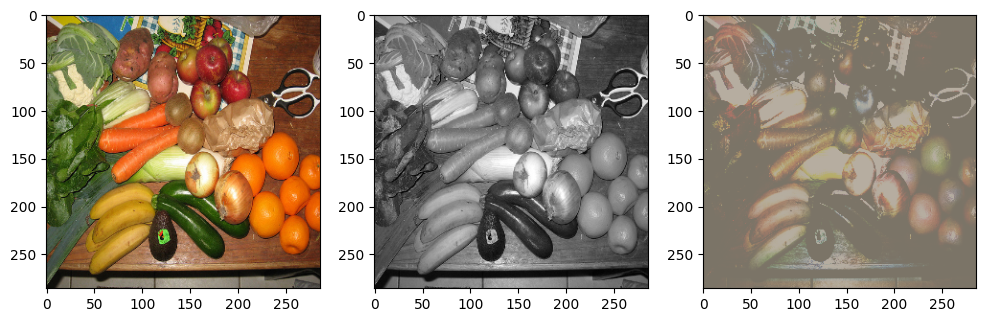

2023-01-14 14:21:47.405520 Epoch 181, Train 40.38627, Valid 0.60761
2023-01-14 14:22:00.576463 Epoch 182, Train 40.36370, Valid 0.53728
2023-01-14 14:22:13.499746 Epoch 183, Train 39.52079, Valid 0.57587


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 183-th epoch for train_loss = 39.52079


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


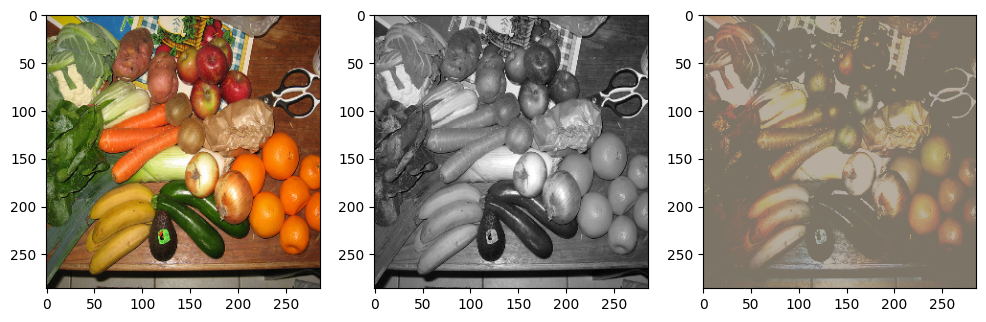

2023-01-14 14:22:29.025342 Epoch 184, Train 40.86548, Valid 0.58319
2023-01-14 14:22:42.414980 Epoch 185, Train 39.68905, Valid 0.57212
2023-01-14 14:22:55.390462 Epoch 186, Train 41.93979, Valid 0.56625
2023-01-14 14:23:08.315781 Epoch 187, Train 39.46683, Valid 0.56408


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 187-th epoch for train_loss = 39.46683


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


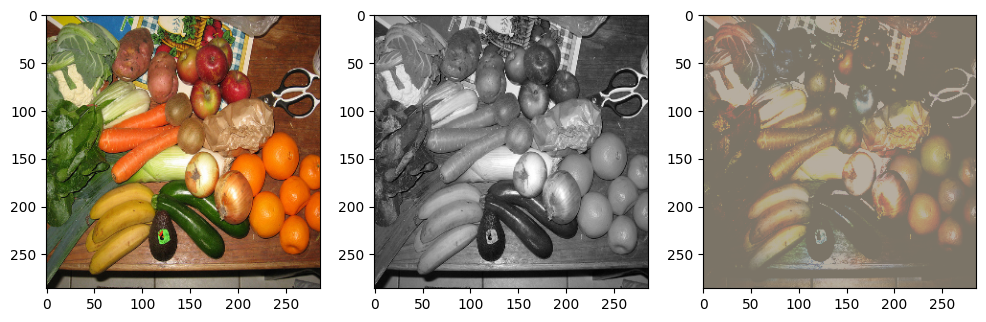

2023-01-14 14:23:23.889231 Epoch 188, Train 39.22962, Valid 0.35497


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 188-th epoch for train_loss = 39.22962


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


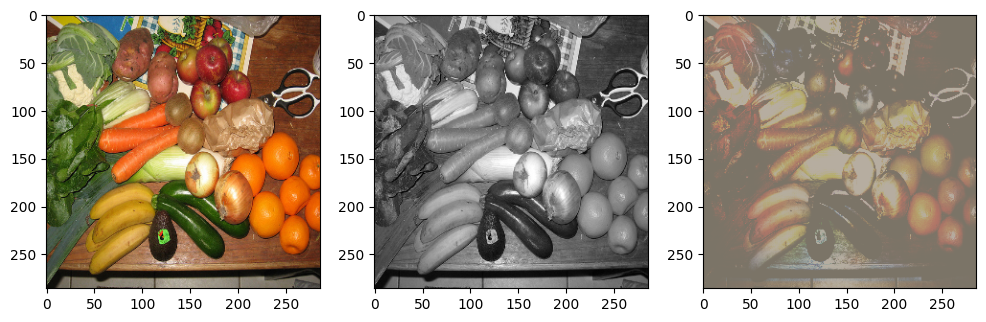

2023-01-14 14:23:39.714672 Epoch 189, Train 41.06125, Valid 0.74764
2023-01-14 14:23:53.338705 Epoch 190, Train 40.42599, Valid 0.45401
2023-01-14 14:24:06.954475 Epoch 191, Train 40.80445, Valid 0.47031
2023-01-14 14:24:20.304378 Epoch 192, Train 40.56838, Valid 0.35812
2023-01-14 14:24:33.344948 Epoch 193, Train 40.52852, Valid 0.60722
2023-01-14 14:24:46.825475 Epoch 194, Train 39.76241, Valid 0.48676
2023-01-14 14:25:00.237689 Epoch 195, Train 41.50859, Valid 0.45811
2023-01-14 14:25:13.407789 Epoch 196, Train 40.65570, Valid 0.38723
2023-01-14 14:25:26.752077 Epoch 197, Train 41.38779, Valid 1.05732
2023-01-14 14:25:39.983062 Epoch 198, Train 39.94669, Valid 0.46488
2023-01-14 14:25:54.637969 Epoch 199, Train 40.44642, Valid 0.36196
2023-01-14 14:26:10.493340 Epoch 200, Train 39.48270, Valid 1.04492
2023-01-14 14:26:23.855204 Epoch 201, Train 39.75995, Valid 0.80999
2023-01-14 14:26:37.265668 Epoch 202, Train 39.85991, Valid 0.62420
2023-01-14 14:26:50.552803 Epoch 203, Train 40.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 210-th epoch for train_loss = 39.05514


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


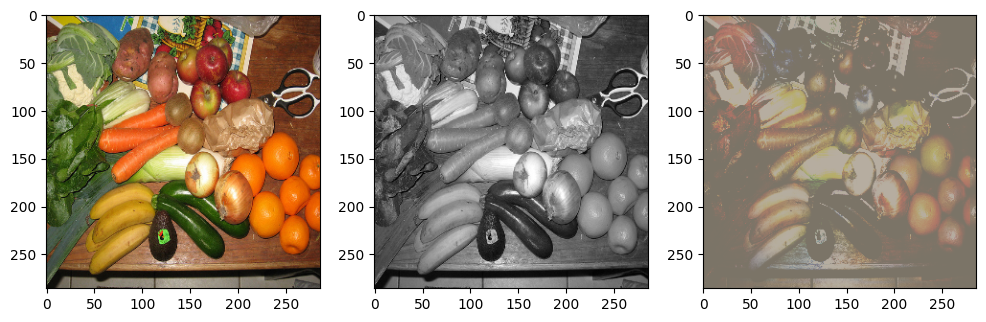

2023-01-14 14:28:39.120257 Epoch 211, Train 40.65750, Valid 1.04527
2023-01-14 14:28:52.419061 Epoch 212, Train 39.63455, Valid 0.94484
2023-01-14 14:29:05.613411 Epoch 213, Train 39.34953, Valid 0.81565
2023-01-14 14:29:18.922881 Epoch 214, Train 40.53442, Valid 0.94534
2023-01-14 14:29:32.311266 Epoch 215, Train 39.76335, Valid 0.82973
2023-01-14 14:29:45.590400 Epoch 216, Train 39.76828, Valid 0.87607
2023-01-14 14:29:58.821662 Epoch 217, Train 40.49332, Valid 0.82488
2023-01-14 14:30:12.117767 Epoch 218, Train 40.82542, Valid 0.79544
2023-01-14 14:30:25.348772 Epoch 219, Train 40.09321, Valid 0.76150
2023-01-14 14:30:38.729391 Epoch 220, Train 40.45761, Valid 0.80057
2023-01-14 14:30:52.065444 Epoch 221, Train 39.53888, Valid 0.72944
2023-01-14 14:31:05.568109 Epoch 222, Train 40.33968, Valid 0.74454
2023-01-14 14:31:19.050818 Epoch 223, Train 41.09137, Valid 0.80391
2023-01-14 14:31:32.367799 Epoch 224, Train 39.63973, Valid 0.78464
2023-01-14 14:31:45.710924 Epoch 225, Train 40.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 247-th epoch for train_loss = 39.04719


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


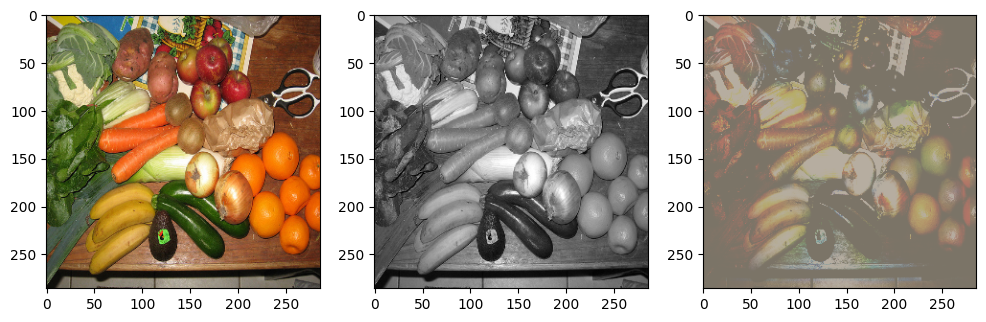

2023-01-14 14:36:53.801193 Epoch 248, Train 40.37489, Valid 0.74246
2023-01-14 14:37:07.142703 Epoch 249, Train 39.11738, Valid 0.82782
2023-01-14 14:37:20.305979 Epoch 250, Train 39.91865, Valid 0.79203
2023-01-14 14:37:33.556477 Epoch 251, Train 39.90787, Valid 0.81930
2023-01-14 14:37:46.944134 Epoch 252, Train 39.29696, Valid 0.73982
2023-01-14 14:38:00.173353 Epoch 253, Train 39.48883, Valid 0.76406
2023-01-14 14:38:13.372784 Epoch 254, Train 39.82094, Valid 0.70890
2023-01-14 14:38:26.500859 Epoch 255, Train 40.76623, Valid 0.78194
2023-01-14 14:38:39.883960 Epoch 256, Train 39.67064, Valid 0.88650
2023-01-14 14:38:53.336917 Epoch 257, Train 39.31789, Valid 0.80271
2023-01-14 14:39:06.778004 Epoch 258, Train 40.11474, Valid 0.74890
2023-01-14 14:39:20.211731 Epoch 259, Train 40.83617, Valid 0.74185
2023-01-14 14:39:33.556295 Epoch 260, Train 40.52006, Valid 0.87814
2023-01-14 14:39:46.924470 Epoch 261, Train 40.77608, Valid 0.81511
2023-01-14 14:40:00.347138 Epoch 262, Train 40.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 301-th epoch for train_loss = 38.87175


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


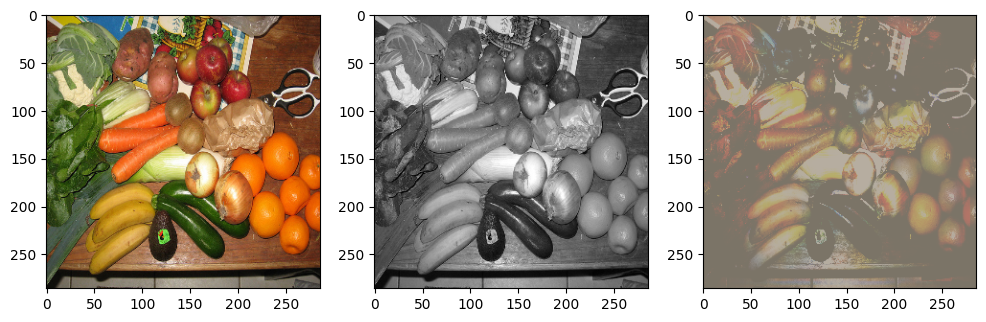

2023-01-14 14:48:54.585392 Epoch 302, Train 39.49474, Valid 0.85195
2023-01-14 14:49:08.062337 Epoch 303, Train 40.15107, Valid 0.82897
2023-01-14 14:49:21.485094 Epoch 304, Train 39.80814, Valid 0.81225
2023-01-14 14:49:34.902361 Epoch 305, Train 39.13285, Valid 0.79930
2023-01-14 14:49:48.202875 Epoch 306, Train 39.25519, Valid 0.87179
2023-01-14 14:50:01.397195 Epoch 307, Train 39.17137, Valid 0.76148
2023-01-14 14:50:14.834272 Epoch 308, Train 40.38568, Valid 0.82042
2023-01-14 14:50:28.269426 Epoch 309, Train 39.42577, Valid 2.06985
2023-01-14 14:50:41.251599 Epoch 310, Train 40.78894, Valid 1.05954
2023-01-14 14:50:54.649854 Epoch 311, Train 38.96653, Valid 2.35571
2023-01-14 14:51:08.097513 Epoch 312, Train 37.73823, Valid 2.53370


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


---- Saving 312-th epoch for train_loss = 37.73823


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


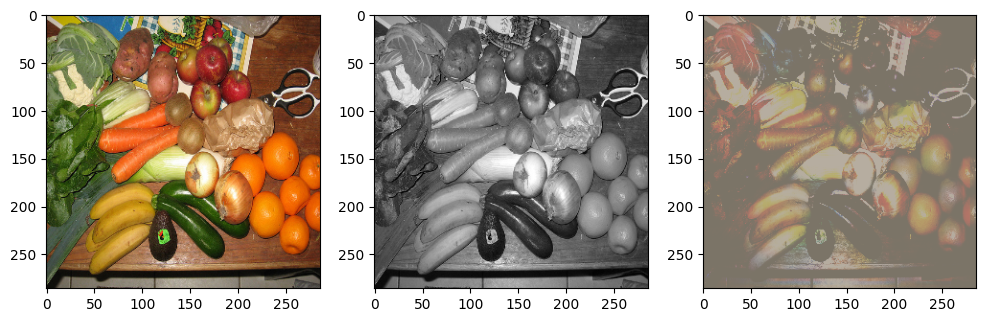

2023-01-14 14:51:23.750206 Epoch 313, Train 39.45273, Valid 1.26744
2023-01-14 14:51:37.257241 Epoch 314, Train 40.85513, Valid 1.30404
2023-01-14 14:51:50.749759 Epoch 315, Train 39.69354, Valid 1.24026
2023-01-14 14:52:04.047739 Epoch 316, Train 40.80055, Valid 1.25369
2023-01-14 14:52:17.423620 Epoch 317, Train 40.75234, Valid 1.17265
2023-01-14 14:52:30.820001 Epoch 318, Train 40.59923, Valid 1.10034
2023-01-14 14:52:44.227991 Epoch 319, Train 40.80141, Valid 0.99907
2023-01-14 14:52:57.629526 Epoch 320, Train 39.58527, Valid 1.16282
2023-01-14 14:53:11.195901 Epoch 321, Train 39.92818, Valid 1.01001
2023-01-14 14:53:24.685440 Epoch 322, Train 40.07739, Valid 1.01440
2023-01-14 14:53:38.023026 Epoch 323, Train 39.45270, Valid 1.22274
2023-01-14 14:53:51.277635 Epoch 324, Train 39.42666, Valid 1.26352
2023-01-14 14:54:04.473502 Epoch 325, Train 40.08082, Valid 1.23439
2023-01-14 14:54:17.878374 Epoch 326, Train 40.33046, Valid 1.33210
2023-01-14 14:54:31.671096 Epoch 327, Train 40.9

2023-01-14 15:18:18.863999 Epoch 434, Train 38.28743, Valid 0.76032
2023-01-14 15:18:32.356838 Epoch 435, Train 40.00271, Valid 0.72945
2023-01-14 15:18:45.671619 Epoch 436, Train 40.43689, Valid 1.05067
2023-01-14 15:18:58.964834 Epoch 437, Train 39.32915, Valid 0.84075
2023-01-14 15:19:12.019405 Epoch 438, Train 39.80113, Valid 0.96013
2023-01-14 15:19:25.181993 Epoch 439, Train 39.40626, Valid 0.75907
2023-01-14 15:19:38.487561 Epoch 440, Train 39.74136, Valid 0.75054
2023-01-14 15:19:51.631101 Epoch 441, Train 39.63177, Valid 0.82237
2023-01-14 15:20:05.146176 Epoch 442, Train 40.31464, Valid 0.86284
2023-01-14 15:20:18.648965 Epoch 443, Train 39.40008, Valid 1.02107
2023-01-14 15:20:31.832526 Epoch 444, Train 40.97276, Valid 0.79961
2023-01-14 15:20:44.825186 Epoch 445, Train 39.06998, Valid 0.72030
2023-01-14 15:20:58.007379 Epoch 446, Train 39.19435, Valid 0.84512
2023-01-14 15:21:11.135667 Epoch 447, Train 39.76180, Valid 0.91990
2023-01-14 15:21:24.254005 Epoch 448, Train 40.5

In [4]:
# Define G and D
unet = UNet(in_channels=1, out_channels=3).to(device=DEVICE)
patchgan = PatchGAN().to(device=DEVICE)

# Train
pix2pix_training(generator = unet,
                 discriminator = patchgan,
                 gen_optimizer = torch.optim.Adam(unet.parameters(), lr=1e-3),
                 dis_optimizer = torch.optim.Adam(patchgan.parameters(), lr=1e-3), 
                 n_epochs = 500, 
                 train_loader = train_dataloader,
                 valid_loader = valid_dataloader,
                 lreg = 100)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


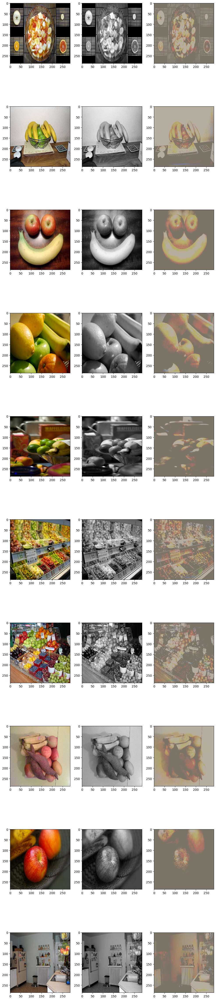

In [5]:
#unet = UNet(in_channels=1, out_channels=3).to(device=DEVICE)

# Load best models
unet.load_state_dict(torch.load(DATAPATH + 'G_100reg.pt', map_location=DEVICE))
unet.eval()
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 60))
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
mean = [-1 * x / y for x, y in zip(mean, std)]
std = [1 / x for x in std]
unnormalize = torchvision.transforms.Normalize(mean=mean, std=std)
for colored, grayscale in valid_dataloader:
    for idx in range(10):
        c = colored[idx]
        g = grayscale[idx]
        plt.subplot(10, 3, 1 + 3 * idx)
        plt.imshow(unnormalize(c).permute(1, 2, 0))
        plt.subplot(10, 3, 2 + 3 * idx)
        plt.imshow(g.permute(1, 2, 0), 'gray')
        generated = unet(g.to(device=DEVICE).unsqueeze(0)).detach().squeeze(0)
        generated = unnormalize(generated)
        plt.subplot(10, 3, 3 + 3 * idx)
        plt.imshow(generated.squeeze(0).cpu().permute(1, 2, 0))
    plt.show()
    break

In [28]:
# Define G and D
unet = UNet(in_channels=1, out_channels=3).to(device=DEVICE)
patchgan = PatchGAN().to(device=DEVICE)

# Train
pix2pix_Labtraining(generator = unet,
                 discriminator = patchgan,
                 gen_optimizer = torch.optim.Adam(unet.parameters(), lr=1e-3),
                 dis_optimizer = torch.optim.Adam(patchgan.parameters(), lr=1e-3), 
                 n_epochs = 500, 
                 train_loader = train_dataloader,
                 valid_loader = valid_dataloader,
                 lreg = 100)

RuntimeError: permute(sparse_coo): number of dimensions in the tensor input does not match the length of the desired ordering of dimensions i.e. input.dim() = 4 is not equal to len(dims) = 3